# Load data

In [28]:
# load the weighted_avg from data/
import pickle

with open('data/weighted_avg_sat.pkl', 'rb') as f:
    weighted_avg_sat = pickle.load(f)

with open('data/weighted_avg_sic.pkl', 'rb') as f:
    weighted_avg_sic = pickle.load(f)

with open('data/weighted_avg_pre.pkl', 'rb') as f:
    weighted_avg_pre = pickle.load(f)

# Rename the keys and merge

In [29]:
renamed_weighted_avg_sat = {f'sat {k}': v for k, v in weighted_avg_sat.items()}
renamed_weighted_avg_sic = {f'sic {k}': v for k, v in weighted_avg_sic.items()}
renamed_weighted_avg_pre = {f'pre {k}': v for k, v in weighted_avg_pre.items()}

# Initialize an empty dictionary
merged_dict_or = {}

# Merge the three dictionaries into one
merged_dict_or.update(renamed_weighted_avg_sat)
merged_dict_or.update(renamed_weighted_avg_sic)
merged_dict_or.update(renamed_weighted_avg_pre)


# Filter the classes

In [30]:
# Remove specified keys
merged_dict_or.pop('sat 2', None)  # None is the default value if the key is not found
merged_dict_or.pop('pre 0', None)
merged_dict_or.pop('sic 0', None)

array([0.03051254, 0.03046647, 0.03045482, 0.03045806, 0.03049705,
       0.03042479, 0.03041693, 0.03045219, 0.03047029, 0.03049891,
       0.03047847, 0.03036354, 0.0304276 , 0.03046899, 0.03048856,
       0.03049884, 0.03035459, 0.03045316, 0.03044886, 0.0303406 ,
       0.03049174, 0.0304134 , 0.03041736, 0.03034557, 0.03044792,
       0.03048694, 0.03037516, 0.03053767, 0.03043855, 0.03040392,
       0.03038303, 0.03036668, 0.03047898, 0.03050404, 0.03033443,
       0.0304286 , 0.03036649, 0.03042389, 0.03036048, 0.03037381,
       0.03041991, 0.03040205, 0.03043645, 0.03041834, 0.03028848,
       0.03051625, 0.03035413, 0.03038088, 0.03036469, 0.03040697,
       0.03038811, 0.03030915, 0.03039049, 0.0304234 , 0.03047339,
       0.03025666, 0.03040741, 0.03048763, 0.03031175, 0.03034587,
       0.03035273, 0.03040386, 0.03035108, 0.03040554, 0.03043098,
       0.03031815, 0.03035154, 0.03039969, 0.030296  , 0.03035304,
       0.03031167, 0.03044671, 0.03034104, 0.03034213, 0.03040

In [ ]:
# import numpy  as np

# # Define your stadial and interstadial periods and labels
# stadials = np.array([[0, 80], [185, 336], [439, 569], [672, 787]])
# interstadials = np.array([[107, 160], [356, 408], [589, 642]])
# stadial_labels = ['S1', 'S2', 'S3', 'S4']
# interstadial_labels = ['IS1', 'IS2', 'IS3']


# # crop the data corresponding to the S2

# # Initialize an empty dictionary
# cropped_dict = {}

# # Crop the data corresponding to the S2
# for key, value in merged_dict.items():
#     cropped_dict[key] = value[185:336]

# merged_dict= cropped_dict
# merged_dict['sat 0'].shape

(0,)

In [32]:
import numpy as np
from scipy.stats import zscore

# Define your stadial and interstadial periods and labels
stadials = np.array([[0, 80], [185, 336], [439, 569], [672, 787]])
interstadials = np.array([[107, 160], [356, 408], [589, 642]])
stadial_labels = ['S1', 'S2', 'S3', 'S4']
interstadial_labels = ['IS1', 'IS2', 'IS3']

# Initialize an empty dictionary to store cropped interstadial data
cropped_dict = {}

# Loop over each key in merged_dict_or and crop the data corresponding to each interstadial period.
for key, value in merged_dict_or.items():
    # normalize the value using zscore
    value = zscore(value)

    cropped_chunks = []
    # Loop over each interstadial period and crop the data.
    for period in interstadials:
        start, end = period  # unpack the start and end indices
        cropped_chunks.append(value[start:end])
    # Combine the cropped chunks together (concatenate along axis 0).
    cropped_dict[key] = np.concatenate(cropped_chunks)


# Replace merged_dict with the cropped and normalized data.
merged_dict = cropped_dict

# Check the shape for one key, e.g., 'sat 0'
print(merged_dict['sat 0'].shape)



(158,)


In [33]:
merged_dict.keys()

dict_keys(['sat 0', 'sat 1', 'sat 3', 'sic 1', 'sic 2', 'sic 3', 'pre 1', 'pre 2'])

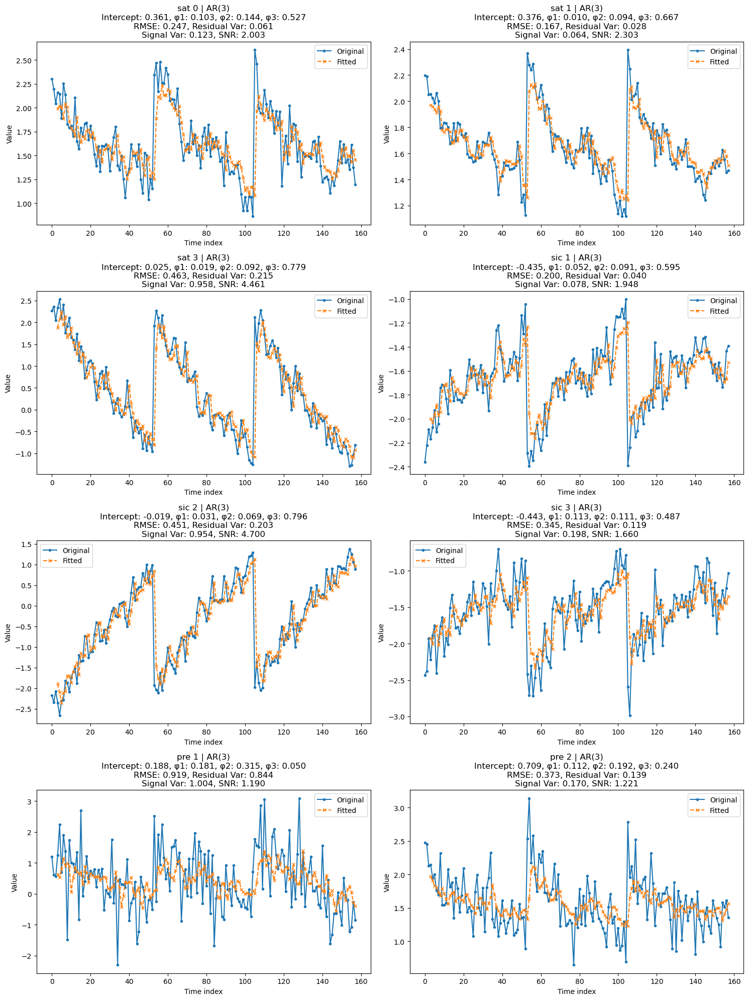

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Set the AR model order to 3 for AR(3)
order = 3

# Prepare subplots: assuming 8 keys in merged_dict, we use a 4 x 2 grid
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()

# Loop through each key in merged_dict
for idx, (key, arr) in enumerate(merged_dict.items()):
    # Build the design matrix X and target vector y for AR(3)
    X, y = [], []
    for t in range(order, len(arr)):
        # For AR(3): use the 3 previous values: arr[t-3], arr[t-2], arr[t-1]
        X.append(arr[t-order:t])
        y.append(arr[t])
    X = np.array(X)  # Shape: (len(arr)-order, order)
    y = np.array(y)  # Shape: (len(arr)-order,)
    
    # Add a constant (intercept) to the design matrix
    X_with_intercept = np.column_stack((np.ones(len(X)), X))
    
    # Fit the AR(3) model using least squares
    params, _, _, _ = np.linalg.lstsq(X_with_intercept, y, rcond=None)
    y_pred = X_with_intercept @ params

    # Compute residuals, their variance, and RMSE
    residuals = y - y_pred
    resid_var = np.var(residuals)
    rmse = np.sqrt(np.mean(residuals**2))
    
    # Compute variance of the target signal and the signal-to-noise ratio (SNR)
    signal_var = np.var(y)
    snr = signal_var / resid_var if resid_var != 0 else np.inf

    # Plot the original data and the fitted predictions.
    # The predictions start at index 'order'
    time_idx = np.arange(len(arr))
    axes[idx].plot(time_idx, arr, label='Original', marker='o', markersize=3, linestyle='-')
    axes[idx].plot(time_idx[order:], y_pred, label='Fitted', marker='x', markersize=4, linestyle='--')
    
    # Build a title string reporting key, AR(3) parameters, RMSE, residual variance, signal variance, and SNR.
    title_str = (f"{key} | AR(3)\n"
                 f"Intercept: {params[0]:.3f}, φ1: {params[1]:.3f}, φ2: {params[2]:.3f}, φ3: {params[3]:.3f}\n"
                 f"RMSE: {rmse:.3f}, Residual Var: {resid_var:.3f}\n"
                 f"Signal Var: {signal_var:.3f}, SNR: {snr:.3f}")
    axes[idx].set_title(title_str)
    axes[idx].set_xlabel('Time index')
    axes[idx].set_ylabel('Value')
    axes[idx].legend()

plt.tight_layout()
plt.show()


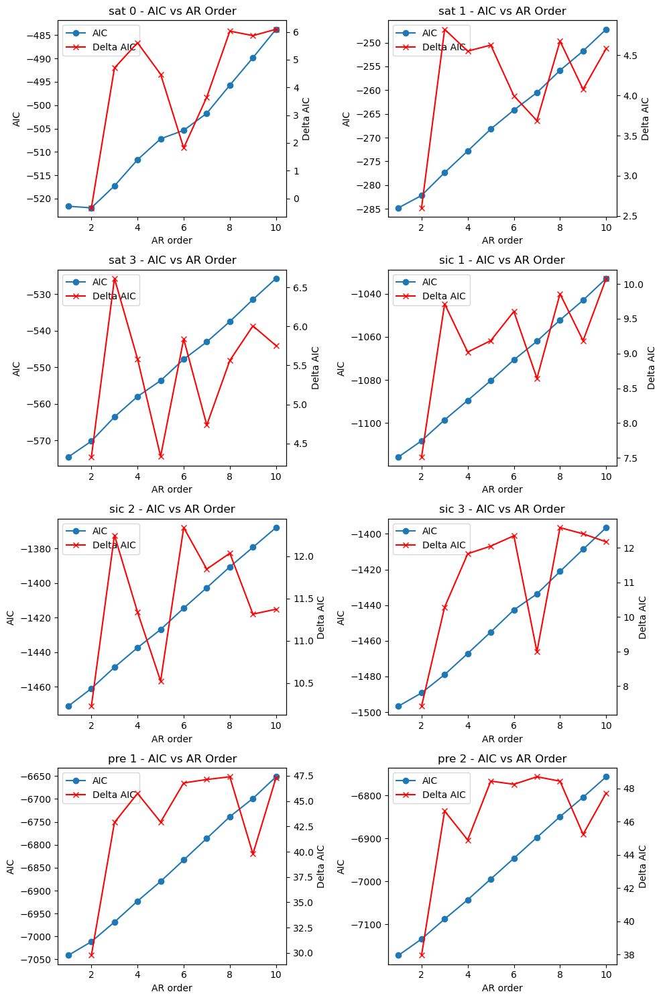

In [22]:
import numpy as np
import matplotlib.pyplot as plt

max_order = 10
n_keys = len(merged_dict)
orders = np.arange(1, max_order+1)

# Create subplots: if we have 8 keys, use a 4 x 2 grid.
fig, axes = plt.subplots(4, 2, figsize=(10, 15))
axes = axes.flatten()

# Loop through each key and its time series in merged_dict
for idx, (key, arr) in enumerate(merged_dict.items()):
    aic_values = []
    
    # Loop over AR orders 1 to max_order
    for order in orders:
        # Build design matrix X and target vector y for AR(order):
        #   y[t] = c + φ₁*y[t-1] + ... + φ_order*y[t-order] + ε_t.
        X, y = [], []
        for t in range(order, len(arr)):
            X.append(arr[t-order:t])  # lagged values
            y.append(arr[t])
        X = np.array(X)
        y = np.array(y)
        
        # Add intercept column
        X_with_intercept = np.column_stack((np.ones(len(X)), X))
        
        # Fit the linear model via least squares
        params, _, _, _ = np.linalg.lstsq(X_with_intercept, y, rcond=None)
        y_pred = X_with_intercept @ params
        
        # Compute residual sum of squares (RSS)
        RSS = np.sum((y - y_pred)**2)
        n = len(y)           # number of observations used in fitting
        k = order + 1        # number of parameters (intercept + order lags)
        
        # Compute AIC:  AIC = 2*k + n * ln(RSS/n)
        AIC = 2 * k + n * np.log(RSS/n)
        aic_values.append(AIC)
        
    aic_values = np.array(aic_values)
    # Compute delta-AIC as the discrete difference between consecutive AIC values.
    delta_aic = np.diff(aic_values)
    
    # Plot AIC on the primary y-axis.
    ax = axes[idx]
    ax.plot(orders, aic_values, marker='o', label='AIC')
    ax.set_xlabel('AR order')
    ax.set_ylabel('AIC')
    ax.set_title(f"{key} - AIC vs AR Order")
    
    # Create a twin axis for delta-AIC.
    ax2 = ax.twinx()
    # Note: delta_aic has length max_order-1, so we plot it against orders[1:].
    ax2.plot(orders[1:], delta_aic, marker='x', color='red', label='Delta AIC')
    ax2.set_ylabel('Delta AIC')
    
    # Combine legends from both axes.
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines + lines2, labels + labels2, loc='best')

plt.tight_layout()
plt.show()


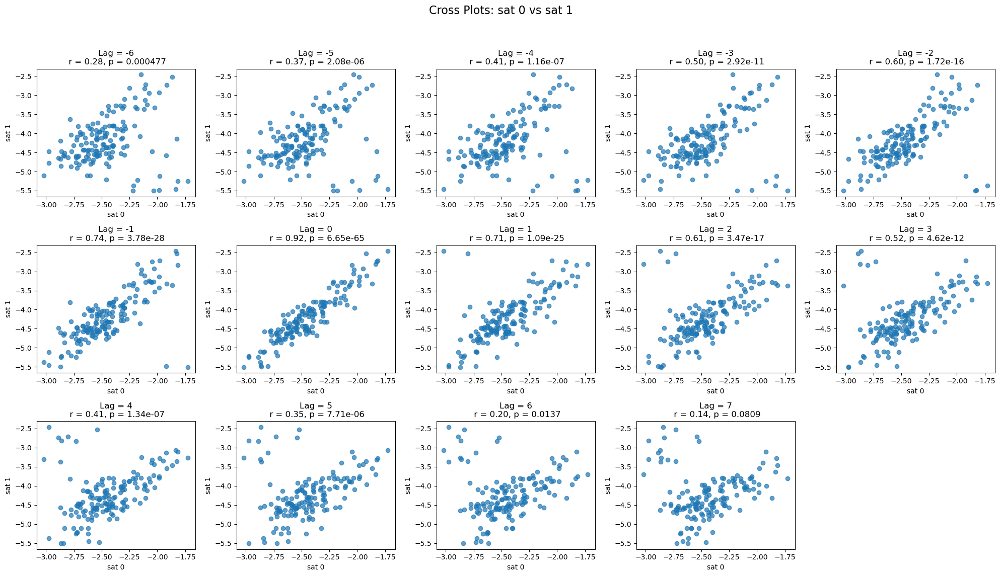

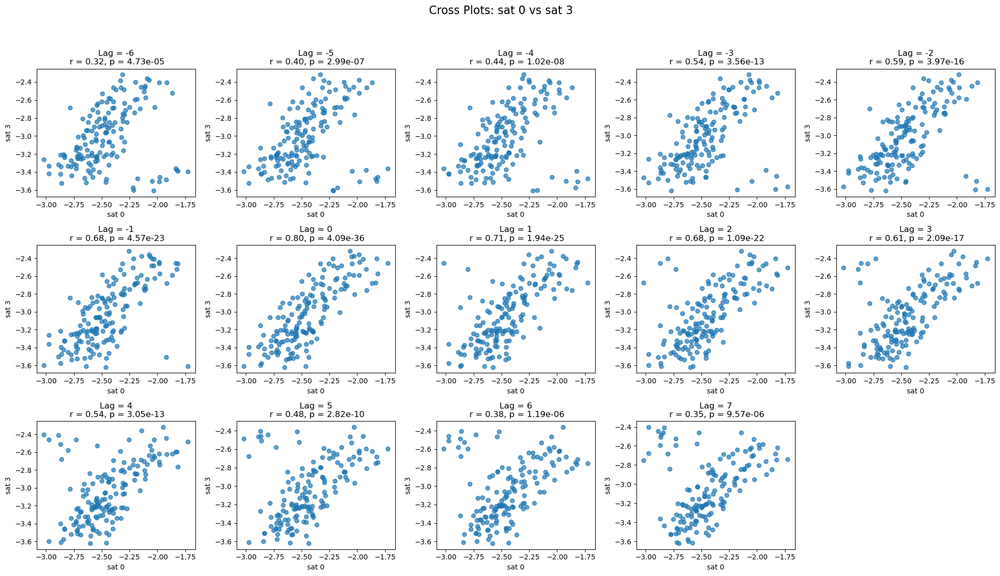

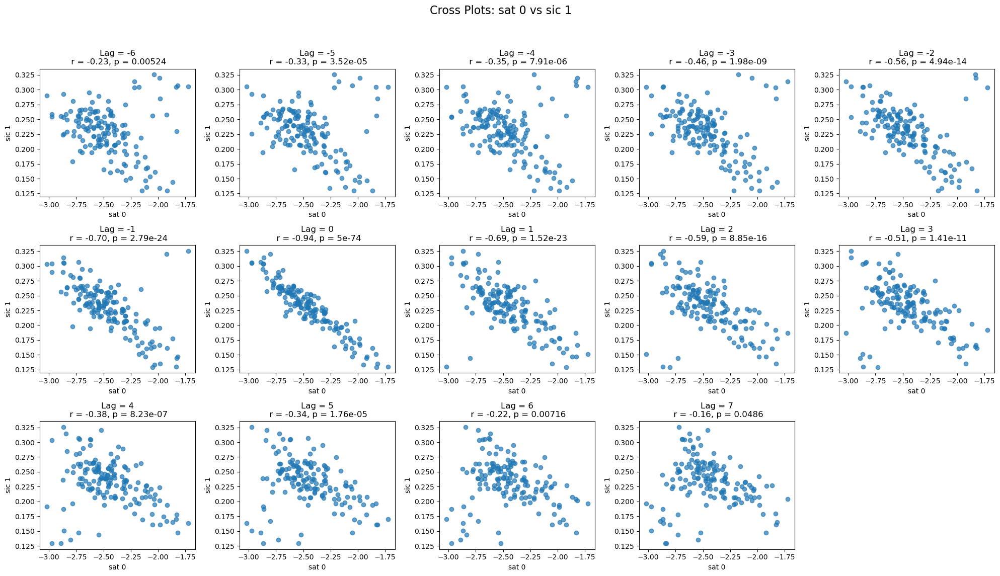

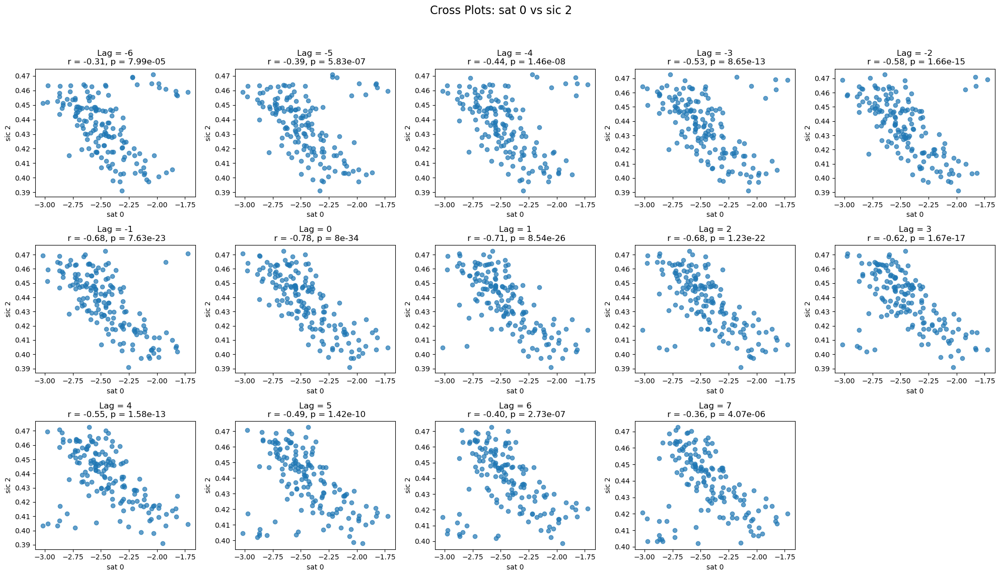

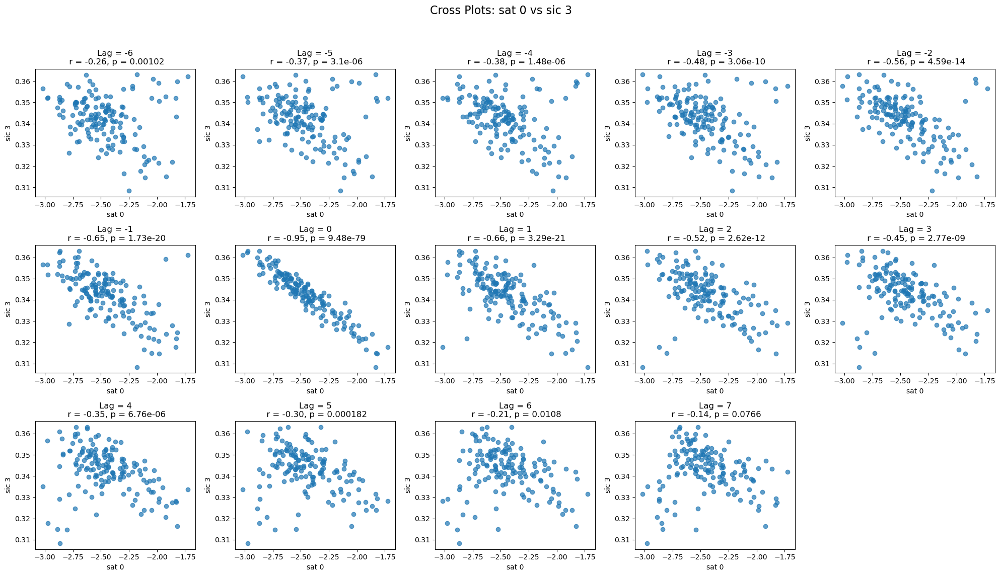

...

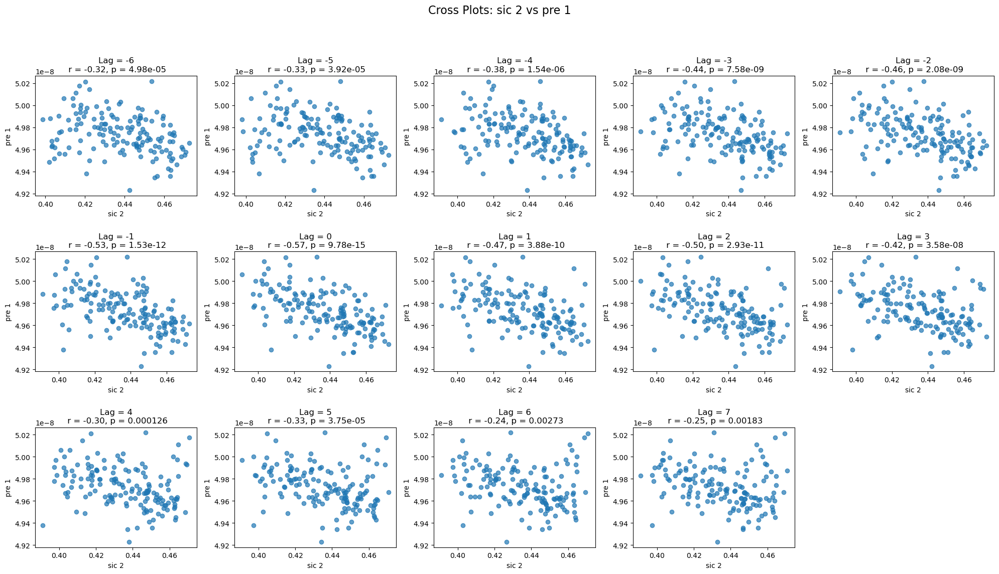

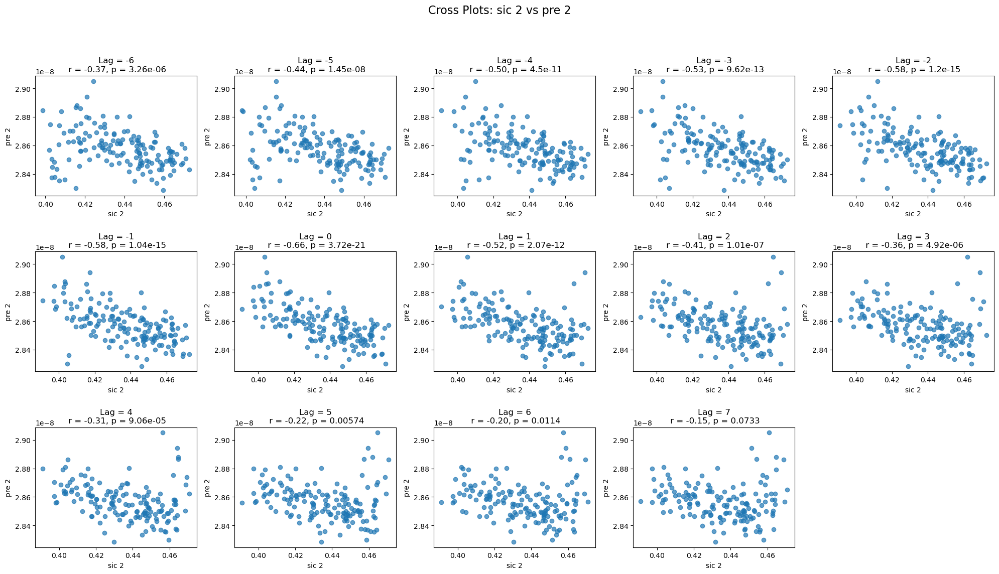

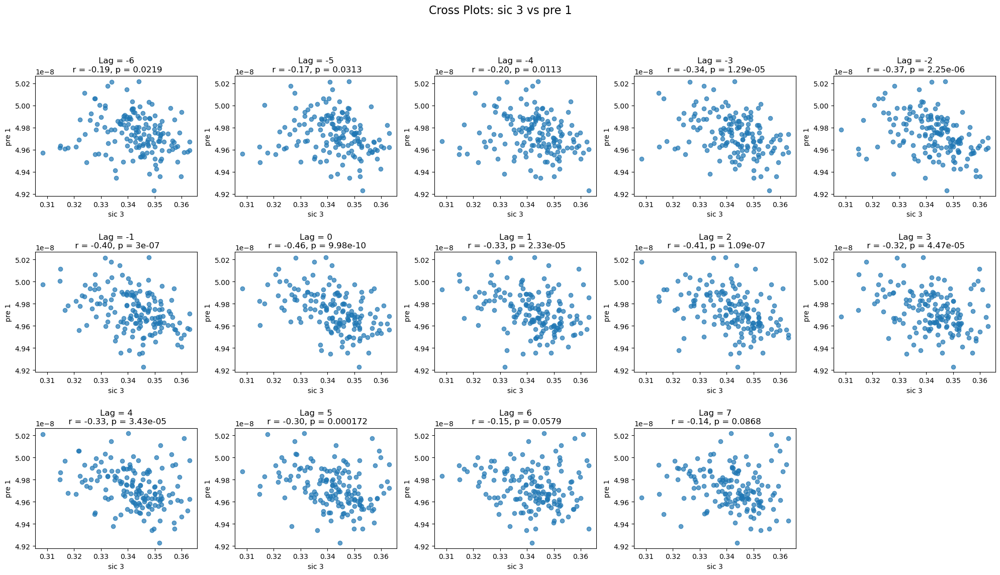

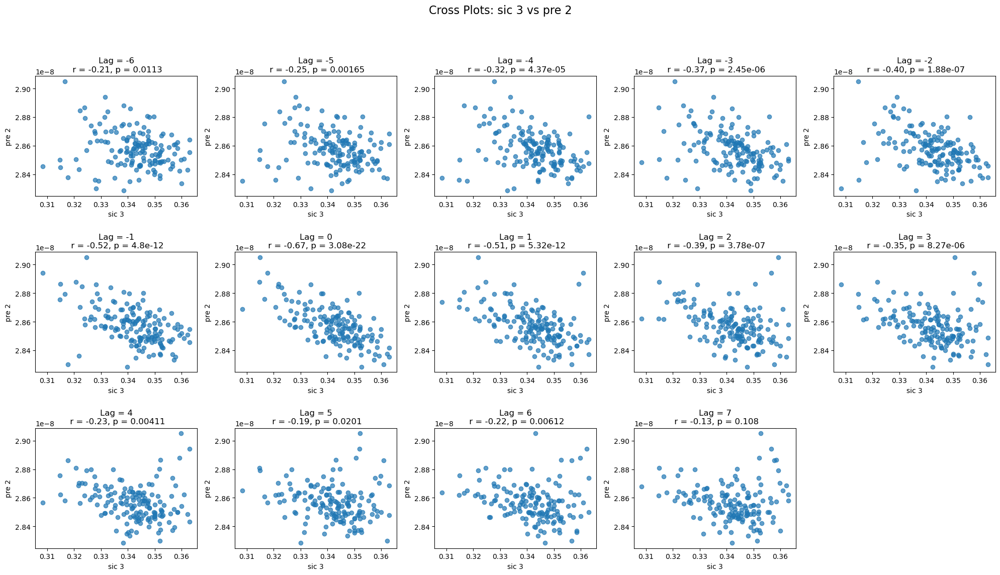

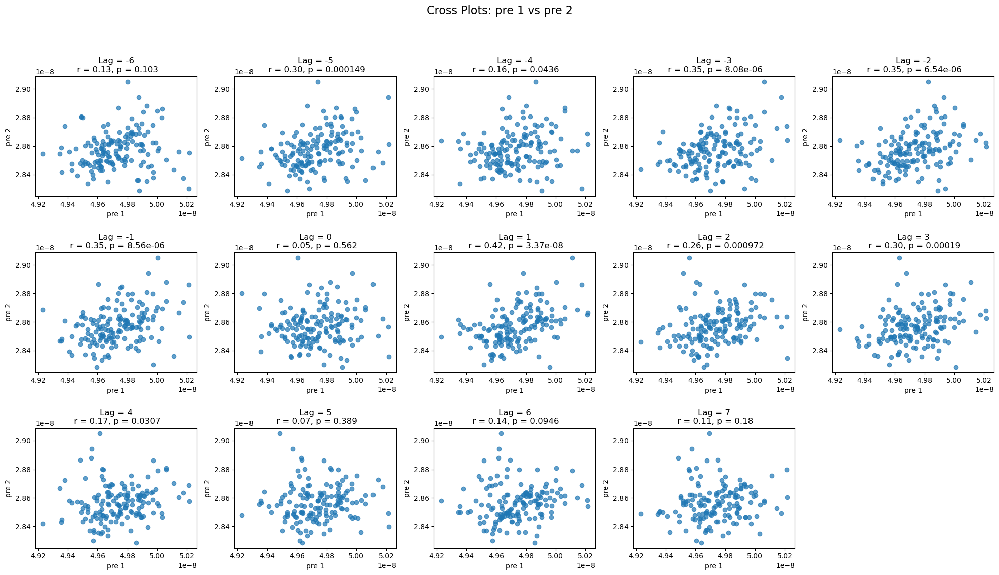

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy import stats


# Define the lags to examine: from -6 to 7 (inclusive)
lags = range(-6, 8)  # This gives 14 lags

# Loop over all unique pairs of keys
for key1, key2 in itertools.combinations(merged_dict.keys(), 2):
    series1 = merged_dict[key1]
    series2 = merged_dict[key2]
    
    # Create a figure with a grid that can hold 14 subplots.
    # We use 3 rows x 5 columns (15 positions) and remove the extra axis later.
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.flatten()
    
    # Loop over each lag and create a scatter plot with correlation statistics.
    for i, lag in enumerate(lags):
        if lag >= 0:
            # For non-negative lag, compare series1[t] with series2[t+lag]
            x = series1[:len(series1) - lag]
            y = series2[lag:]
        else:
            # For negative lag, shift series1 forward (or series2 backward)
            x = series1[-lag:]
            y = series2[:len(series2) + lag]
            
        # Compute Pearson correlation coefficient and p-value
        if len(x) > 1 and len(y) > 1:
            r, p_value = stats.pearsonr(x, y)
        else:
            r, p_value = np.nan, np.nan

        axes[i].scatter(x, y, alpha=0.7)
        axes[i].set_title(f"Lag = {lag}\n r = {r:.2f}, p = {p_value:.3g}")
        axes[i].set_xlabel(key1)
        axes[i].set_ylabel(key2)
    
    # Remove any unused subplots (if grid size > number of lags)
    for j in range(len(lags), len(axes)):
        fig.delaxes(axes[j])
        
    fig.suptitle(f"Cross Plots: {key1} vs {key2}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
